<a href="https://colab.research.google.com/github/rahulrajgovintharaj-bit/CV-COLAB/blob/main/Pose%20estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install mediapipe opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 24.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0


In [2]:

!pip uninstall mediapipe -y
!pip install mediapipe==0.10.14 opencv-python

Found existing installation: mediapipe 0.10.32
Uninstalling mediapipe-0.10.32:
  Successfully uninstalled mediapipe-0.10.32
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 15.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.6
    Uninstalling protobuf-5.29.6:
      Successfully uninstalled protobuf-5.29.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydf 0.15.0 requires protobuf<7.0.0,>=5.29.1, but you have protobuf 4.25.8 which is incompatible.
opentelemetry-proto 1.38.0 requires protobuf<7.0,>=5.0, but you have protobuf 4.25.8 which is incompatible.
grpcio-status 1.71.2 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 4.25.8 which is incompatible.
grain 0.2.16 requires protobuf>=5.28.3, but you have protobuf 4.2

In [1]:

import mediapipe as mp

print(mp.__version__)
print(dir(mp))

0.10.14
['CalculatorGraph', 'GraphInputStreamAddMode', 'Image', 'ImageFormat', 'ImageFrame', 'Matrix', 'Packet', 'Timestamp', 'ValidatedGraphConfig', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', 'calculators', 'model_ckpt_util', 'packet_creator', 'packet_getter', 'resource_util', 'solutions', 'tasks']


In [2]:

import cv2
import mediapipe as mp
from google.colab.patches import cv2_imshow

In [3]:

from google.colab import files
uploaded = files.upload()

Saving VID-20260311-WA0001.mp4 to VID-20260311-WA0001.mp4


/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


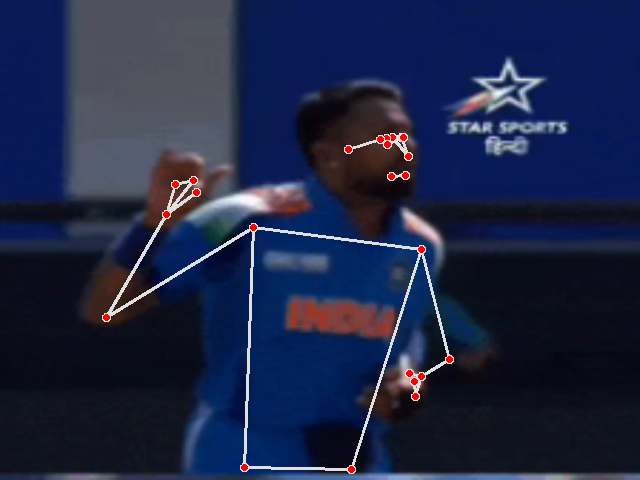

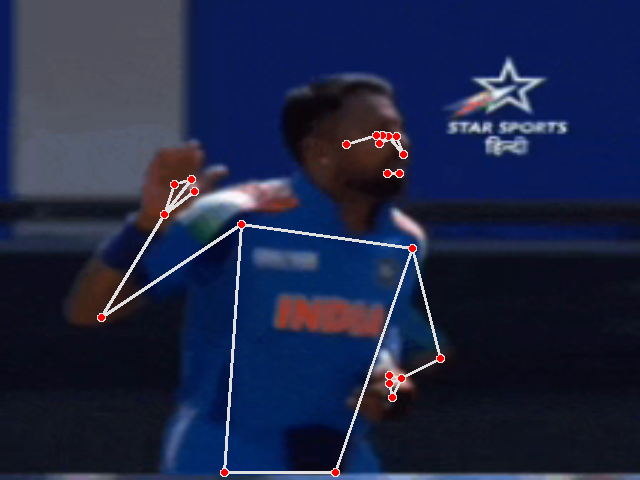

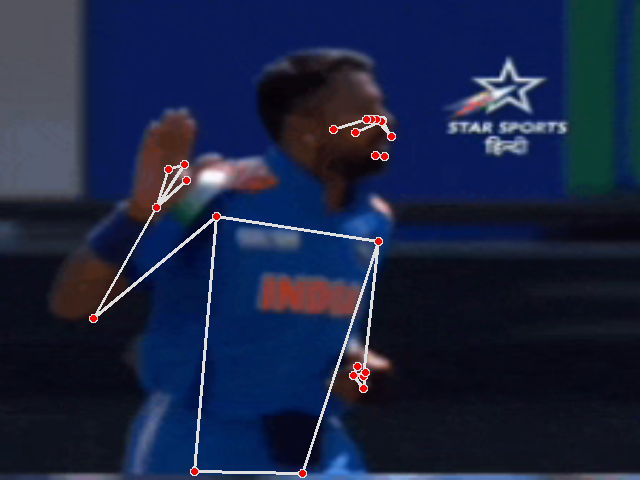

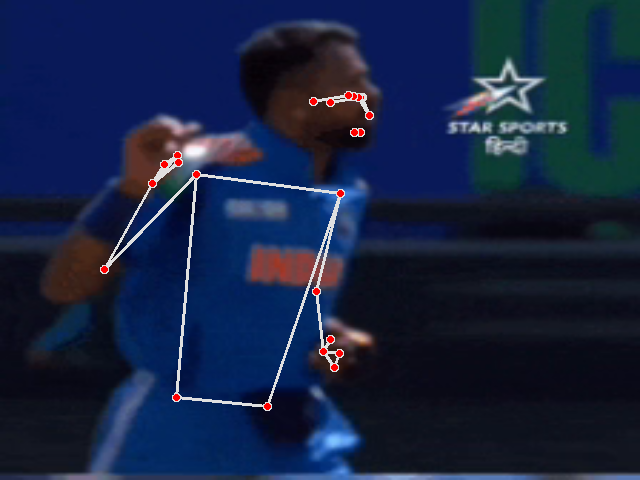

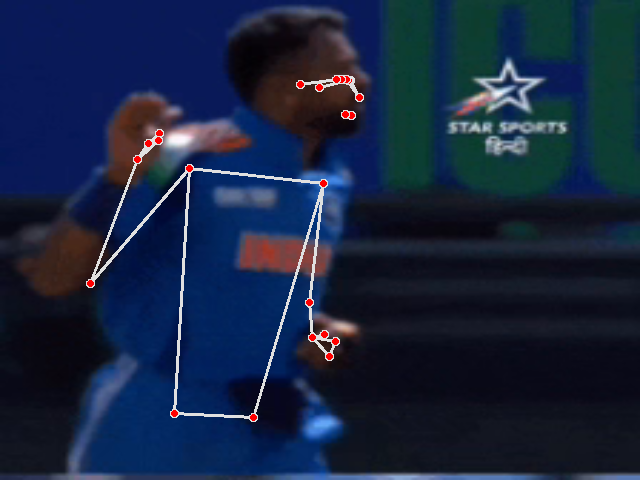

...

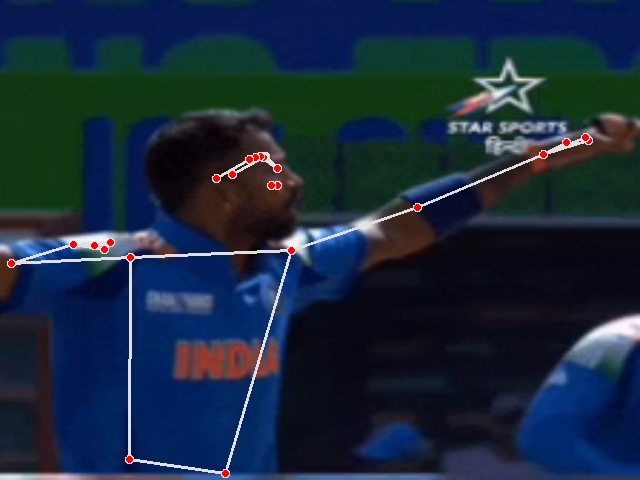

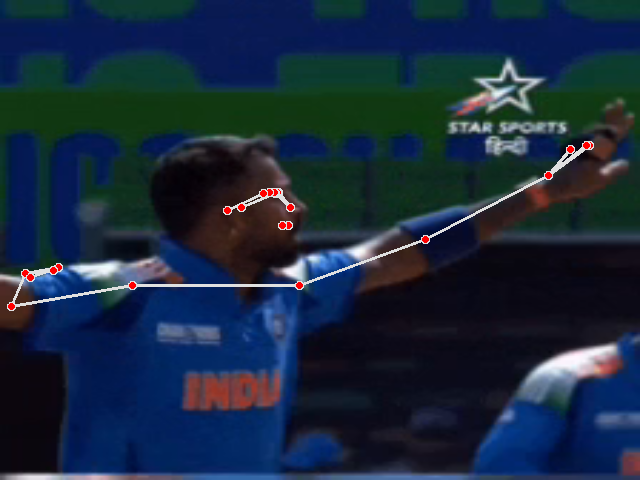

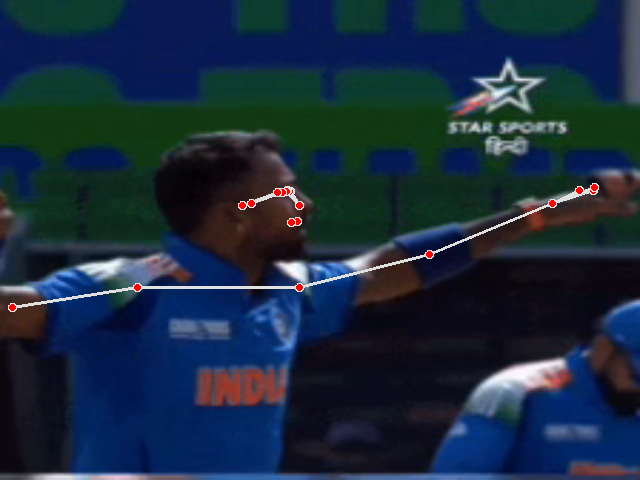

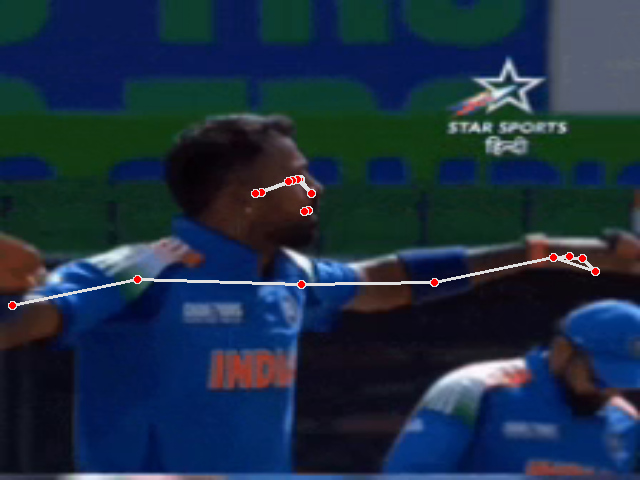

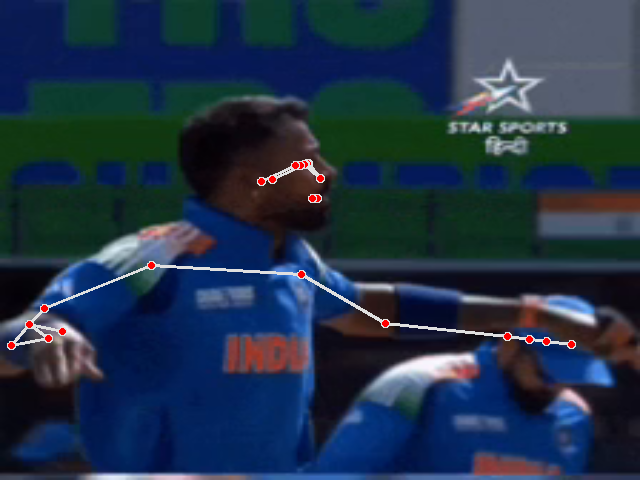

In [4]:
# Initialize MediaPipe Pose model
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5
)

# Drawing utility
mp_drawing = mp.solutions.drawing_utils

def estimate_pose_from_video(video_path, width=640, height=480):

    cap = cv2.VideoCapture(video_path)

    while cap.isOpened():
        ret, frame = cap.read()

        if not ret:
            break

        # Resize
        frame_resized = cv2.resize(frame, (width, height))

        # Convert BGR → RGB
        frame_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

        # Pose detection
        results = pose.process(frame_rgb)

        # Draw landmarks
        if results.pose_landmarks:
            mp_drawing.draw_landmarks(
                frame_resized,
                results.pose_landmarks,
                mp_pose.POSE_CONNECTIONS
            )

        # Show frame in Colab
        cv2_imshow(frame_resized)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cap.release()

# Run
estimate_pose_from_video('VID-20260311-WA0001.mp4')